In [2]:
import pandas as pd
import inflection
import folium
from folium.plugins import MarkerCluster
import plotly.express as px


In [3]:
df = pd.read_csv('../data/zomato.csv')

### Limpeza de DataFrame

In [4]:
# Renomeando Colunas
def rename_columns(dataframe):
    df = dataframe.copy()
    title = lambda x: inflection.titleize(x) 
    snakecase = lambda x: inflection.underscore(x) 
    spaces = lambda x: x.replace(" ", "")
    cols_old = list(df.columns)
    cols_old = list(map(title, cols_old)) 
    cols_old = list(map(spaces, cols_old)) 
    cols_new = list(map(snakecase, cols_old)) 
    df.columns = cols_new
    return df

df1 = rename_columns(df)

# Removendo duplicadas
df1 = df1.drop_duplicates()

# Removendo coluna Switch to order menu que possui linhas com apenas 1 valor
df1 = df1.drop('switch_to_order_menu', axis=1)

# Removendo linhas NULL (NaN)
df1 = df1.dropna()

## Removendo valores multiplos (Filipino, American, Italian, Bakery) da coluna 'Cuisines'
df1["cuisines"] = df1.loc[:, "cuisines"].apply(lambda x: x.split(",")[0])


### Adicao de colunas

In [5]:
#Coluna Country Name
COUNTRIES = {
    1: "India",
    14: "Australia",
    30: "Brazil",
    37: "Canada",
    94: "Indonesia",
    148: "New Zeland",
    162: "Philippines",
    166: "Qatar",
    184: "Singapure",
    189: "South Africa",
    191: "Sri Lanka",
    208: "Turkey",
    214: "United Arab Emirates",
    215: "England",
    216: "United States of America",
}

def country_name(country_id):
    return COUNTRIES.get(country_id)

df1['country_name'] = df1['country_code'].apply(country_name)

# Coluna Price Type
def create_price_type(price_range):
    if price_range == 1: return "cheap"
    elif price_range == 2: return "normal"
    elif price_range == 3: return "expensive"
    else:
        return "gourmet"

df1['price_type'] = df1['price_range'].apply(create_price_type)


# Coluna Color Name
COLORS = {
   "3F7E00": "darkgreen",
   "5BA829": "green",
   "9ACD32": "lightgreen",
   "CDD614": "orange",
   "FFBA00": "red",
   "CBCBC8": "darkred",
   "FF7800": "darkred",
}
def color_name(color_code):
    return COLORS[color_code]

df1['color_name'] = df1['rating_color'].apply(color_name)

## Visão Geral

### 1. Quantos restaurantes únicos estão registrados?

In [6]:
df_aux = df1['restaurant_id'].nunique()
df_aux

6929

### 2. Quantos países únicos estão registrados?

In [6]:
df1['country_code'].nunique()

15

### 3. Quantas cidades únicas estão registradas?

In [7]:
df1['city'].nunique()

125

### 4. Qual o total de avaliações feitas?

In [8]:
num = df1['votes'].sum()
numero_formatado = "{:,}".format(num).replace(",", ".")
numero_formatado

'4.194.533'

### 5. Qual o total de tipos de culinária registrados?

In [9]:
df1['cuisines'].nunique()

165

## Visão País

#### MAPA

In [12]:

map = folium.Map()
cluster = MarkerCluster().add_to(map)
cols = ['restaurant_name', 'latitude','longitude', 'average_cost_for_two', 'cuisines', 'aggregate_rating', 'country_name']
df_aux = df1.loc[:, cols]
    
for index, location_info in df_aux.iterrows():
    folium.Marker([location_info['latitude'], location_info['longitude']],
                 popup="{} Preço para dois: {} Type: {}  Nota Agregada: {}".format(location_info['restaurant_name'],
                                                                                         location_info['average_cost_for_two'],
                                                                                         location_info['cuisines'],
                                                                                         location_info['aggregate_rating']),
                
                 icon=folium.Icon(color='green', icon='home', prefix='fa')).add_to(cluster)

map

### 1. Qual o nome do país que possui mais cidades registradas?


In [18]:
more_cities = df1.groupby("country_name")['city'].count().sort_values(ascending=False).reset_index()
more_cities.values[0]

array(['India', 3111], dtype=object)

### 2. Qual o nome do país que possui mais restaurantes registrados?

In [20]:
df_aux = df1.groupby('country_name')['restaurant_name'].nunique().sort_values(ascending = False).reset_index()
df_aux.values[0]

array(['India', 2480], dtype=object)

### 3. Qual o nome do país que possui mais restaurantes com o nível de preço igual a 4 registrados?

In [22]:
line = df1.loc[:, 'price_range'] == 3
cols = ['country_name', 'price_range']
df_aux = df1.loc[line, cols].groupby('country_name')['price_range'].count().sort_values(ascending=False).reset_index()
df_aux.values[0]

array(['India', 910], dtype=object)

### 4. Qual o nome do país que possui a maior quantidade de tipos de culinária distintos?

In [23]:
df_aux = df1.groupby('country_name')['cuisines'].nunique().sort_values(ascending=False).reset_index()
df_aux.values[0]

array(['India', 77], dtype=object)

### 5. Qual o nome do país que possui a maior quantidade de avaliações feitas?

In [24]:
df_aux = df1.groupby('country_name')['votes'].sum().sort_values(ascending=False).reset_index()
df_aux.values[0]

array(['India', 2800164], dtype=object)

### 6. Qual o nome do país que possui a maior quantidade de restaurantes que fazem entrega?

In [18]:
df_aux = df1[df1['has_online_delivery'] == 1].groupby('country_name')['restaurant_name'].count()
df_aux.idxmax()

'India'

### 7. Qual o nome do país que possui a maior quantidade de restaurantes que aceitam reservas?

In [25]:
df_aux = df1[df1['has_table_booking'] == 1].groupby('country_name')['restaurant_name'].count().sort_values(ascending=False).reset_index()
df_aux.values[0]

array(['India', 256], dtype=object)

### 8. Qual o nome do país que possui, na média, a maior quantidade de avaliações registrada?

In [26]:
cols = ['country_name', 'votes']
df_aux = df1.loc[:,cols].groupby('country_name')['votes'].mean().sort_values(ascending=False).reset_index()
df_aux.values[0]

array(['Indonesia', 1112.825], dtype=object)

### 9. Qual o nome do país que possui, na média, a maior nota média registrada?

In [27]:
cols = ['country_name', 'aggregate_rating']
df_aux = df1.loc[:,cols].groupby('country_name')['aggregate_rating'].mean().sort_values(ascending=False).reset_index()
df_aux.values[0]

array(['Indonesia', 4.60125], dtype=object)

### 10. Qual o nome do país que possui, na média, a menor nota média registrada?

In [30]:
cols = ['country_name', 'aggregate_rating']
df_aux = df1.loc[:,cols].groupby('country_name')['aggregate_rating'].mean().sort_values(ascending=True).reset_index()
df_aux.values[0]

array(['Brazil', 3.3216666666666668], dtype=object)

### 11. Qual a média de preço de um prato para dois por país?

In [31]:
df1.groupby('country_name')['average_cost_for_two'].median().reset_index()

,country_name,average_cost_for_two
0,Australia,60.0
1,Brazil,120.0
2,Canada,40.0
3,England,35.0
4,India,600.0
5,Indonesia,275000.0
6,New Zeland,50.0
7,Philippines,1200.0
8,Qatar,150.0
9,Singapure,100.0


### 12. Quantidade de Restaurantes registrados por país

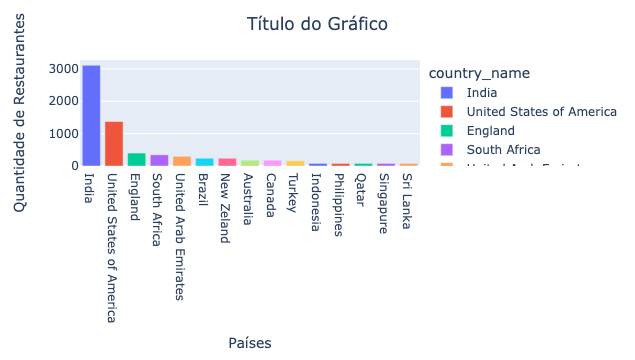

In [25]:
# Quantidade de Restaurantes registrados por país

df_aux = df1.groupby('country_name').count().sort_values(by='restaurant_id', ascending=False ).reset_index()
fig = px.bar(df_aux, x=df_aux['country_name'], y=df_aux['restaurant_id'], color=df_aux['country_name'])
fig.update_layout(
    title='Título do Gráfico',
    title_x = 0.5,
    xaxis=dict(title='Países'),
    yaxis=dict(title='Quantidade de Restaurantes'),
)
fig.show()

## Visao Cidade

### 1. Qual o nome da cidade que possui mais restaurantes registrados?

In [36]:
df_aux = df1.loc[:, ['restaurant_id', 'city']].groupby('city')['restaurant_id'].count().sort_values(ascending=False).reset_index()

df_aux.values[0]

array(['Abu Dhabi', 80], dtype=object)

### 2. Qual o nome da cidade que possui mais restaurantes com nota média acima de 4?

In [38]:
df_aux = df1.loc[df1.loc[:, 'aggregate_rating'] > 4].groupby('city')['restaurant_id'].count().sort_values(ascending=False).reset_index()
df_aux.values[0]

array(['Bangalore', 79], dtype=object)

### 3. Qual o nome da cidade que possui mais restaurantes com nota média abaixo de 2.5?

In [39]:
df_aux = df1[df1['aggregate_rating'] < 2.5].groupby('city')['restaurant_id'].count().sort_values(ascending=False).reset_index()
df_aux.values[0]

array(['Gangtok', 33], dtype=object)

### 4. Qual o nome da cidade que possui o maior valor médio de um prato para dois?

In [40]:
df1.groupby('city')['average_cost_for_two'].max().sort_values(ascending=False).reset_index()
df_aux.values[0]

array(['Gangtok', 33], dtype=object)

### 5. Qual o nome da cidade que possui a maior quantidade de tipos de culinária distintas?

In [41]:

df_aux = df1.loc[:, ['city', 'cuisines']].groupby('city')['cuisines'].nunique().sort_values(ascending=False).reset_index()
df_aux.values[0]

array(['Birmingham', 32], dtype=object)

### 6. Qual o nome da cidade que possui a maior quantidade de restaurantes que fazem reservas?

In [43]:
line = df1.loc[:, 'has_table_booking'] == True
df_aux = df1.loc[line, :].groupby('city')['has_table_booking'].count().sort_values(ascending=False).reset_index()
df_aux.values[0]

array(['Bangalore', 42], dtype=object)

### 7. Qual o nome da cidade que possui a maior quantidade de restaurantes que fazem entregas?

In [44]:
line = df1.loc[:, 'is_delivering_now'] == True
df_aux = df1.loc[line, :].groupby('city')['is_delivering_now'].count().sort_values(ascending=False).reset_index()
df_aux.values[0]

array(['Vadodara', 48], dtype=object)

### 8. Qual o nome da cidade que possui a maior quantidade de restaurantes que aceitam pedidos online?

In [45]:
line = df1.loc[:, 'has_online_delivery'] == True
df_aux = df1.loc[line, :].groupby('city')['has_online_delivery'].count().sort_values(ascending=False).reset_index()
df_aux.values[0]

array(['Bhopal', 75], dtype=object)

## Visao Restaurantes

### 1. Qual o nome do restaurante que possui a maior quantidade de avaliações?

In [36]:
line = df1.loc[:,'votes'].idxmax()
df1.loc[line, ['restaurant_name', 'country_name', 'votes']]

restaurant_name    Bawarchi
country_name          India
votes                 41333
Name: 3928, dtype: object

### 2. Qual o nome do restaurante com a maior nota média?

In [37]:
line = df1.loc[:,'aggregate_rating'].idxmax()
df1.loc[line, ['restaurant_name', 'country_name', 'aggregate_rating']]

restaurant_name     Mendokoro Ramenba
country_name              Philippines
aggregate_rating                  4.9
Name: 17, dtype: object

### 3. Qual o nome do restaurante que possui o maior valor de uma prato para duas pessoas?

In [38]:
line = df1.loc[:,'average_cost_for_two'].idxmax()
df1.loc[line, ['restaurant_name', 'country_name', 'average_cost_for_two']]

restaurant_name         d'Arry's Verandah Restaurant
country_name                               Australia
average_cost_for_two                        25000017
Name: 385, dtype: object

### 4. Qual o nome do restaurante de tipo de culinária brasileira que possui a menor média de avaliação?

In [39]:
line = (df1.loc[:, 'cuisines'] == 'Brazilian') & (df1.loc[:,'average_cost_for_two'].idxmin())
df_aux = df1.loc[line,['restaurant_id', 'restaurant_name', 'aggregate_rating', 'country_name']].sort_values(by='aggregate_rating', ascending=True)
df_aux2 = df_aux.head(15)
df_aux2.loc[df_aux.loc[:, 'restaurant_id'] == 6600100, :]

,restaurant_id,restaurant_name,aggregate_rating,country_name
126,6600100,Loca Como tu Madre,0.0,Brazil


### 5. Qual o nome do restaurante de tipo de culinária brasileira, e que é do Brasil, que possui a maior média de avaliação?

In [40]:
line = (df1.loc[:, 'cuisines'] == 'Brazilian') & (df1.loc[:, 'country_name'] == 'Brazil') & (df1.loc[:,'average_cost_for_two'].idxmin())
df_aux = df1.loc[line, :].sort_values(by='aggregate_rating', ascending=False)
df_aux2 = df_aux.iloc[0,[0,1,16,20]]
pd.DataFrame(df_aux2)

,207
restaurant_id,7300955
restaurant_name,Braseiro da Gávea
aggregate_rating,4.9
country_name,Brazil


### 6. Os restaurantes que aceitam pedido online são também, na média, os restaurantes que mais possuem avaliações registradas?

R: Sim, pois 1164 dos 2428 restaurantes que aceitam pedidos online estao incluso entre os restaurantes mais avaliados.

In [41]:
online_delivery = df1.loc[:, 'has_online_delivery'] == 1
df_aux = df1.loc[online_delivery, :]
df_aux.shape
df_aux2 = df1.sort_values(by='votes', ascending=False)
df_aux2 = df_aux2.head(2428)
df_aux2['exists'] = df_aux['restaurant_name'].isin(df_aux2['restaurant_name'])
df_aux2.groupby('exists')['restaurant_name'].count()

exists
True    1164
Name: restaurant_name, dtype: int64

### 7. Os restaurantes que fazem reservas são também, na média, os restaurantes que possuem o maior valor médio de um prato para duas pessoas?

R: Nao, pois dos 420 restaurantes que aceitam reserva, apenas 94 estao na lista dos restaurantes com maior valor medio de um prato para duas pessoas. ou seja, menos da metade.

In [42]:
reserva = df1.loc[:, 'has_table_booking'] == True
df_aux = df1.loc[reserva, :]
df_aux.shape


(420, 23)

In [43]:
df_aux2 = df1.sort_values(by='average_cost_for_two', ascending=False)
df_aux2 = df_aux2.head(420)
df_aux2['reserva'] = df_aux['restaurant_name'].isin(df_aux2['restaurant_name'])
df_aux2.groupby('reserva')['restaurant_name'].count()

reserva
True    94
Name: restaurant_name, dtype: int64

### 8. Os restaurantes do tipo de culinária japonesa dos Estados Unidos da América possuem um valor médio de prato para duas pessoas maior que as churrascarias americanas (BBQ)?

R: Sim, pois a culinaria Japonesa dos Estados unidos possui como media do valor medio de prato para duas pessoas o valor de 56.40, ja as churrascarias americanas o valor é de 39.64

In [44]:
line = (df1.loc[:, 'cuisines'] == 'Japanese') & (df1.loc[:, 'country_name'] == 'United States of America')
df_aux = df1.loc[line, ['cuisines', 'country_name', 'average_cost_for_two']].sort_values(by='average_cost_for_two', ascending = False)
df_aux['average_cost_for_two'].mean()

56.40625

In [45]:
line = (df1.loc[:, 'cuisines'] == 'BBQ') & (df1.loc[:, 'country_name'] == 'United States of America')
df_aux = df1.loc[line, ['cuisines', 'country_name', 'average_cost_for_two']].sort_values(by='average_cost_for_two', ascending = False)
df_aux['average_cost_for_two'].mean()

39.642857142857146

## Visao Culinária

In [46]:
# Tipos de culinárias
df1['cuisines'].unique()

array(['Italian', 'European', 'Filipino', 'American', 'Korean', 'Pizza',
       'Taiwanese', 'Japanese', 'Coffee', 'Chinese', 'Seafood',
       'Singaporean', 'Vietnamese', 'Latin American', 'Healthy Food',
       'Cafe', 'Fast Food', 'Brazilian', 'Argentine', 'Arabian', 'Bakery',
       'Tex-Mex', 'Bar Food', 'International', 'French', 'Steak',
       'German', 'Sushi', 'Grill', 'Peruvian', 'North Eastern',
       'Ice Cream', 'Burger', 'Mexican', 'Vegetarian', 'Contemporary',
       'Desserts', 'Juices', 'Beverages', 'Spanish', 'Thai', 'Indian',
       'Mineira', 'BBQ', 'Mongolian', 'Portuguese', 'Greek', 'Asian',
       'Author', 'Gourmet Fast Food', 'Lebanese', 'Modern Australian',
       'African', 'Coffee and Tea', 'Australian', 'Middle Eastern',
       'Malaysian', 'Tapas', 'New American', 'Pub Food', 'Southern',
       'Diner', 'Donuts', 'Southwestern', 'Sandwich', 'Irish',
       'Mediterranean', 'Cafe Food', 'Korean BBQ', 'Fusion', 'Canadian',
       'Breakfast', 'Cajun', 'Ne

### 1. Dos restaurantes que possuem o tipo de culinária italiana, qual o nome do restaurante com a maior média de avaliação?

In [48]:
df_aux = df1[df1['cuisines'] == 'Italian'].sort_values(by='aggregate_rating', ascending=False).head(18)
df_aux.loc[df_aux['restaurant_id'].idxmin(), 'restaurant_name']

'Darshan'

### 2. Dos restaurantes que possuem o tipo de culinária italiana, qual o nome do restaurante com a menor média de avaliação? 

In [49]:
df_aux = df1[df1['cuisines'] == 'Italian'].sort_values(by='aggregate_rating', ascending=True).head(8)
df_aux.loc[df_aux['restaurant_id'].idxmin(), 'restaurant_name']

'Avenida Paulista'

### 3. Dos restaurantes que possuem o tipo de culinária americana, qual o nome do restaurante com a maior média de avaliação?

In [50]:
df_aux = df1[df1['cuisines'] == 'American'].sort_values(by='aggregate_rating', ascending=False).head(26)
df_aux.loc[df_aux['restaurant_id'].idxmin(), 'restaurant_name']

'Burger & Lobster'

### 4. Dos restaurantes que possuem o tipo de culinária americana, qual o nome do restaurante com a menor média de avaliação?

In [51]:
df_aux = df1[df1['cuisines'] == 'American'].sort_values(by='aggregate_rating', ascending=True).head(8)
df_aux.loc[df_aux['aggregate_rating'] == 0.0, 'restaurant_name']

6751    Alston Bar & Beef
Name: restaurant_name, dtype: object

### 5. Dos restaurantes que possuem o tipo de culinária árabe, qual o nome do restaurante com a maior média de avaliação?

In [52]:
df_aux = df1[df1['cuisines'] == 'Arabian'].sort_values(by='aggregate_rating', ascending=False).head(18)
df_aux.loc[df_aux['aggregate_rating'] == 4.7, 'restaurant_name']

3896    Mandi@36
Name: restaurant_name, dtype: object

### 6. Dos restaurantes que possuem o tipo de culinária árabe, qual o nome do restaurante com a menor média de avaliação?

In [53]:
df_aux = df1[df1['cuisines'] == 'Arabian'].sort_values(by='aggregate_rating', ascending=True)
#df_aux.loc[df_aux['restaurant_id'].idxmin(), 'restaurant_name']
df_aux.loc[df_aux['aggregate_rating'] == 0.0, 'restaurant_name']

337    Raful
Name: restaurant_name, dtype: object

### 7. Dos restaurantes que possuem o tipo de culinária japonesa, qual o nome do restaurante com a maior média de avaliação?

In [55]:
df_aux = df1[df1['cuisines'] == 'Japanese'].sort_values(by='aggregate_rating', ascending=False).head(17)
df_aux.loc[df_aux['restaurant_id'].idxmin(), 'restaurant_name']

'Sushi Samba'

### 8. Dos restaurantes que possuem o tipo de culinária japonesa, qual o nome do restaurante com a menor média de avaliação?

In [56]:
df_aux = df1[df1['cuisines'] == 'Japanese'].sort_values(by='aggregate_rating', ascending=True)
df_aux.loc[df_aux['aggregate_rating'] == 0.0, 'restaurant_name']

123    Banzai Sushi
Name: restaurant_name, dtype: object

### 9. Dos restaurantes que possuem o tipo de culinária caseira, qual o nome do restaurante com a maior média de avaliação?

In [57]:
df_aux = df1[df1['cuisines'] == 'Home-made'].sort_values(by='aggregate_rating', ascending=False)
df_aux.loc[df_aux['aggregate_rating'] == 4.0, 'restaurant_name']

7525    Kanaat Lokantası
Name: restaurant_name, dtype: object

### 10. Dos restaurantes que possuem o tipo de culinária caseira, qual o nome do restaurante com a menor média de avaliação?

In [58]:
df_aux = df1[df1['cuisines'] == 'Home-made'].sort_values(by='aggregate_rating', ascending=True)
df_aux.loc[df_aux['aggregate_rating'] == 3.7, 'restaurant_name']

7373    GurMekan Restaurant
Name: restaurant_name, dtype: object

### 11. Qual o tipo de culinária que possui o maior valor médio de um prato para duas pessoas?


In [47]:
df_aux = df1.groupby('cuisines')['average_cost_for_two'].max().sort_values(ascending= False).reset_index()
df_aux.values[0]

array(['Modern Australian', 25000017], dtype=object)

### 12. Qual o tipo de culinária que possui a maior nota média?

In [63]:
df_aux = df1.groupby('cuisines')['aggregate_rating'].max().sort_values(ascending= False).head(55).reset_index()
df_aux

,cuisines,aggregate_rating
0,Indian,4.9
1,Greek,4.9
2,Korean,4.9
3,Tapas,4.9
4,Japanese,4.9
5,Italian,4.9
6,International,4.9
7,Ice Cream,4.9
8,Tex-Mex,4.9
9,German,4.9


### 13. Qual o tipo de culinária que possui mais restaurantes que aceitam pedidos online e fazem entregas?

In [61]:
lines = (df1.loc[:, 'has_online_delivery'] == 1) & (df1.loc[:, 'is_delivering_now'] == 1)
df_aux = df1.loc[lines, ['cuisines', 'restaurant_id']].groupby('cuisines')['restaurant_id'].count().sort_values(ascending=False)
df_aux = pd.DataFrame(df_aux).reset_index()
df_aux.loc[df_aux.loc[:, 'restaurant_id'].idxmax(), 'cuisines']

'North Indian'

# Visao Países Dashboard Streamlit

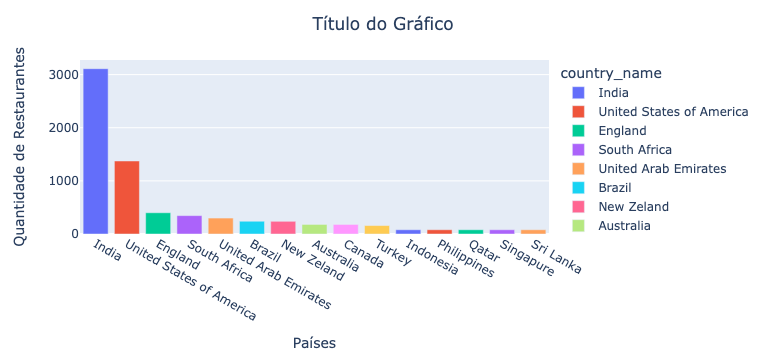

In [ ]:
# Quantidade de Restaurantes registrados por país

df_aux = df1.groupby('country_name').count().sort_values(by='restaurant_id', ascending=False ).reset_index()
fig = px.bar(df_aux, x=df_aux['country_name'], y=df_aux['restaurant_id'], color=df_aux['country_name'])
fig.update_layout(
    title='Título do Gráfico',
    title_x = 0.5,
    xaxis=dict(title='Países'),
    yaxis=dict(title='Quantidade de Restaurantes'),
)
fig.show()

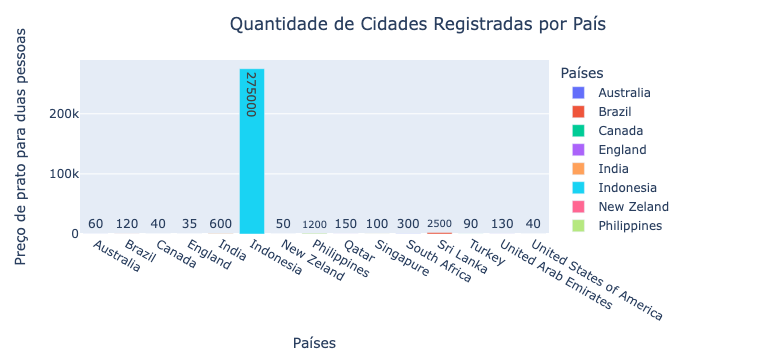

In [ ]:
# Media de preco de prato para duas pessoas por País

df_aux = df1.groupby('country_name')['average_cost_for_two'].median().reset_index()

fig = px.bar(df_aux, x=df_aux['country_name'], y=df_aux['average_cost_for_two'], color=df_aux['country_name'], labels={'country_name': 'Países', 'average_cost_for_two' : 'Preço de prato para duas pessoas'}, text=df_aux['average_cost_for_two'])
fig.update_layout(
    title='Quantidade de Cidades Registradas por País',
    title_x = 0.3,)
fig.show()

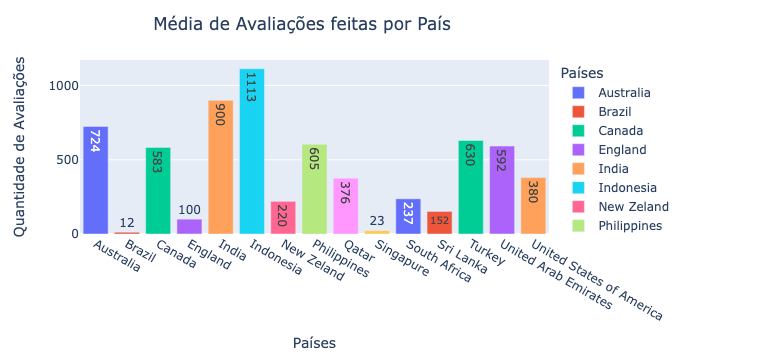

In [ ]:
# Media de avaliacoes por País

df_aux = round(df1.groupby('country_name')['votes'].mean().reset_index())

fig = px.bar(df_aux, x=df_aux['country_name'], y=df_aux['votes'], color=df_aux['country_name'], labels={'country_name': 'Países', 'votes' : 'Quantidade de Avaliações'}, text=df_aux['votes'])
fig.update_layout(
    title='Média de Avaliações feitas por País',
    title_x = 0.2,)
fig.show()

# Visao Cidades Dashboard Streamlit

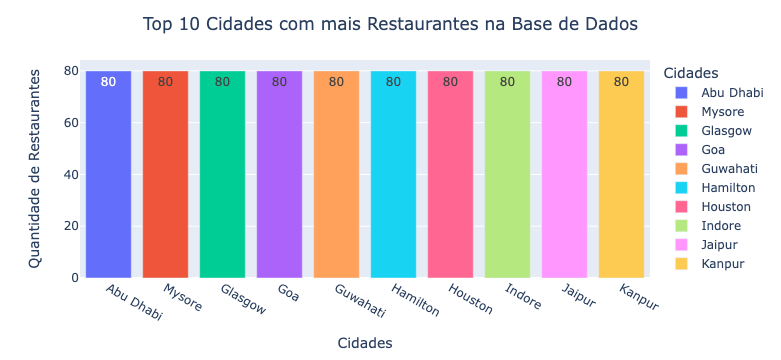

In [66]:
# top 10 cidades com mais restaurantes na base de dados
df_aux = df1.groupby('city')['restaurant_id'].count().reset_index().sort_values(by='restaurant_id',ascending=False).head(10)

fig = (px.bar(df_aux, x=df_aux['city'], y=df_aux['restaurant_id'], color=df_aux['city'],
              labels={'city': 'Cidades', 'restaurant_id' : 'Quantidade de Restaurantes'},
              text=df_aux['restaurant_id']))
fig.update_layout(
    title='Top 10 Cidades com mais Restaurantes na Base de Dados',
    title_x = 0.5,)
fig.show()

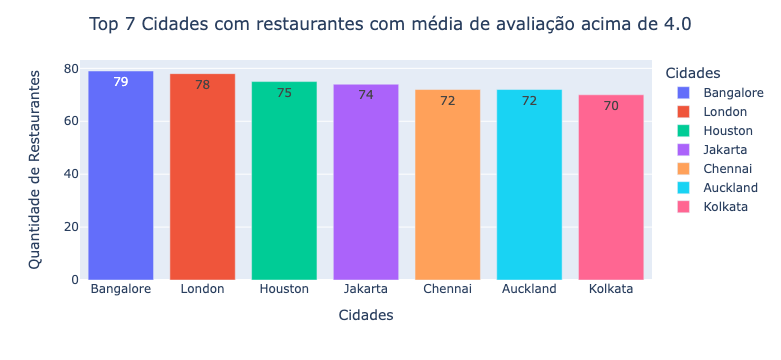

In [67]:
# Top 7 Cidades com restaurantes com média de avaliação acima de 4
line = df1.loc[:, 'aggregate_rating'] > 4
df_aux = (df1.loc[line, :].groupby('city')['restaurant_id'].count()
          .reset_index().sort_values(by='restaurant_id', ascending=False).head(7))
fig = (px.bar(df_aux, x=df_aux['city'], y=df_aux['restaurant_id'], color=df_aux['city'],
              labels={'city': 'Cidades', 'restaurant_id' : 'Quantidade de Restaurantes'},
              text=df_aux['restaurant_id']))
fig.update_layout(
    title='Top 7 Cidades com restaurantes com média de avaliação acima de 4.0',
    title_x = 0.5,)
fig.show()

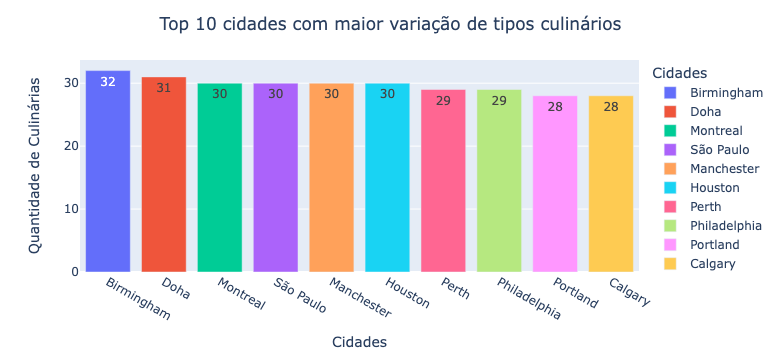

In [68]:
# Top 10 cidades com maior variação de tipos culinários
df_aux = df1.groupby('city')['cuisines'].nunique().sort_values(ascending=False).reset_index().head(10)
fig = (px.bar(df_aux, x=df_aux['city'], y=df_aux['cuisines'], color=df_aux['city'],
              labels={'city': 'Cidades', 'cuisines' : 'Quantidade de Culinárias'},
              text=df_aux['cuisines']))
fig.update_layout(
    title='Top 10 cidades com maior variação de tipos culinários',
    title_x = 0.5,)
fig.show()

# Para mais insights visite o dashboard online em: https://dslucasribeiro-fomezero.streamlit.app